# TVB-NEST: Bridging multiscale activity by co-simulation

## Step-by-step learn how to perform a co-simulation embedding spiking neural networks into large-scale brain networks using TVB.

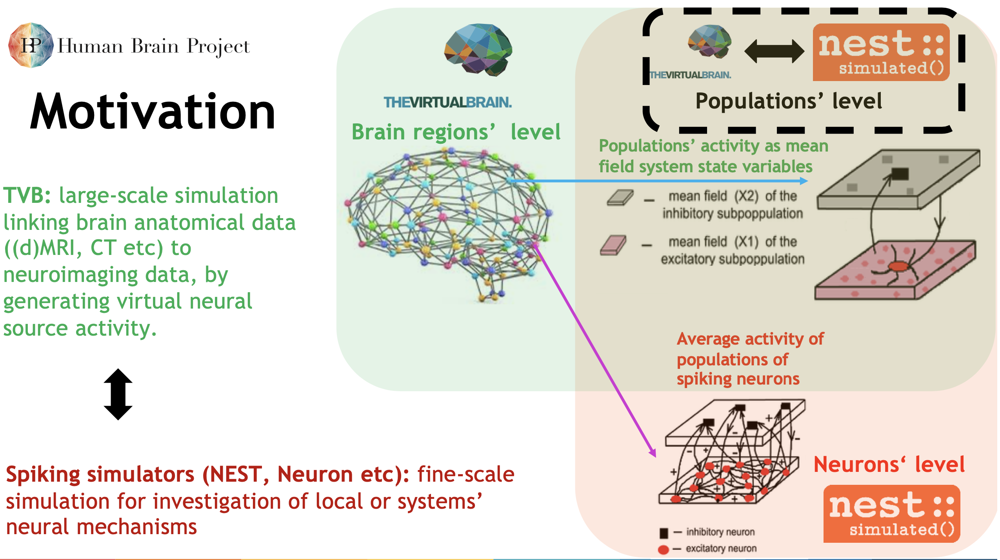

In [1]:
from IPython.core.display import Image, display
display(Image(filename='./pics/ConceptGraph1.png',  width=1000, unconfined=False))

## tvb-multiscale toolbox:

### https://github.com/the-virtual-brain/tvb-multiscale

For questions use the git issue tracker, or write an e-mail to me: dionysios.perdikis@charite.de

# TVB - NEST co-simulation with Wilson & Cowan model

We demonstrate a multiscale simulation <br> of a Wilson & Cowan  model [1] <br> using TVB [1, 2] for brain region modelled at coarse scale, <br> and NEST [3] for regions modelled as <br> networks of spiking neural populations.

## Wilson & Cowan mean field model

See [1] for the equations (4.6a&b) of the model and for the parameters used here (column c in Table 11) for oscillatory regime.

## Spiking network model in NEST

For every neuron $i$ in region node $n$ modelled in NEST as a spiking network of "integrate and fire" neurons with alpha synapses:


$ C_m{\dot{V}_{ni}}^m = - {I_{ni}}^L(t) - {I_{ni}}^{exc}(t) - {I_{ni}}^{inh}(t) + {I_{ni}}^{ext}(t) $

$\;\;\;\;\;\;\;\;\;\;=-g_L({V_{ni}}^m(t) - V_L) $
              
$\;\;\;\;\;\;\;\;\;\;\;-g_{exc_{ni}}({V_{ni}}^m(t) - V_{exc}) $

$\;\;\;\;\;\;\;\;\;\;\;-g_{inh_{ni}}({V_{ni}}^m(t) - V_{inh}) $

$\;\;\;\;\;\;\;\;\;\;\;+{I_{ni}}^{ext}(t) $

$ \ddot{g}_{exc_{ni}} = -\frac{1}{\tau_{syn_{exc}}}\dot{g}_{exc_{ni}} + \left[ \sum_{j=1,j \neq i}^{N_{E/I}} \sum_k \delta(t-{t_j}^k) \right]_{j<-E}$

$ \dot{g}_{exc_{ni}} = \dot{g}_{exc_{ni}} -\frac{g_{exc_{ni}}}{\tau_{syn_{exc}}}$

$ \ddot{g}_{inh_{ni}} = -\frac{1}{\tau_{syn_{inh}}}\dot{g}_{inh_{ni}} + \left[ \sum_{j=1,j \neq i}^{N_{E/I}} \sum_k \delta(t-{t_j}^k) \right]_{j<-I}$

$ \dot{g}_{inh_{ni}} = \dot{g}_{inh_{ni}} -\frac{g_{inh_{ni}}}{\tau_{syn_{inh}}}$

When $V_m(t) > V_{th}$, emit a spike and clamp $V_m(t)$ to $V_{reset}$ for $\tau_{ref}$ ms.


## TVB to NEST coupling
TVB couples to NEST via instantaneous spike rate $ 1000 * N_E * E(t) $, 
where 1000 stands for the conversion from spikes/ms to spikes/sec. 

Spike generator NEST devices are used as TVB "proxy" nodes and generate spike trains 

$ \left[ \sum_k \delta(t-\tau_{n\prime n}-{t_j}^k) \right]_{j \in n\prime} $

Notice that all large-scale input is always scaled with the size of the excitatory population $ N_E $.

## NEST to TVB update

A NEST spike recorder device is used to count spike for each time step, and convert it to an instant population mean rate that overrides the TVB state variables $E$ and $I$ after low pass filtering via a linear dynamical equation:

$ {\dot{E}_{n}}  = -\frac{1}{\tau_{Ein_{n}}}({E_{n}}(t) - {E_{in_{n}}}(t)) $

$ {\dot{I}_{n}}  = -\frac{1}{\tau_{Iin_{n}}}({I_{n}}(t) - {I_{in_{n}}}(t)) $


where:

$ {E_{in_{n}}}(t) =  \frac{\sum_j\left[ \sum_k \delta(t-\tau_n-{t_j}^k) \right]_{j \in E_n}}{N_E} $

$ {I_{in_{n}}}(t) =  \frac{\sum_j\left[ \sum_k \delta(t-\tau_n-{t_j}^k) \right]_{j \in I_n}}{N_I} $


and $ \tau_{Ein_{n}} = \tau_{Iin_{n}} = 1.0 ms $ by default.

# WORKFLOW:

In [2]:
import os
from collections import OrderedDict
import time
import numpy as np

from tvb.basic.profile import TvbProfile
TvbProfile.set_profile(TvbProfile.LIBRARY_PROFILE)

from tvb_multiscale.tvb_nest.config import *

work_path = os.getcwd()
outputs_path = os.path.join(work_path, "outputs/WilsonCowan")
config = Config(output_base=outputs_path)

config.figures.SHOW_FLAG = True 
config.figures.SAVE_FLAG = True
config.figures.FIG_FORMAT = 'png'
config.figures.DEFAULT_SIZE= config.figures.NOTEBOOK_SIZE
FIGSIZE = config.figures.DEFAULT_SIZE

from tvb_multiscale.core.plot.plotter import Plotter
plotter = Plotter(config.figures)

# For interactive plotting:
# %matplotlib notebook  

# Otherwise:
%matplotlib inline 

## 1. Load structural data <br> (minimally a TVB connectivity)  <br> & prepare TVB simulator  <br> (region mean field model, integrator, monitors etc)

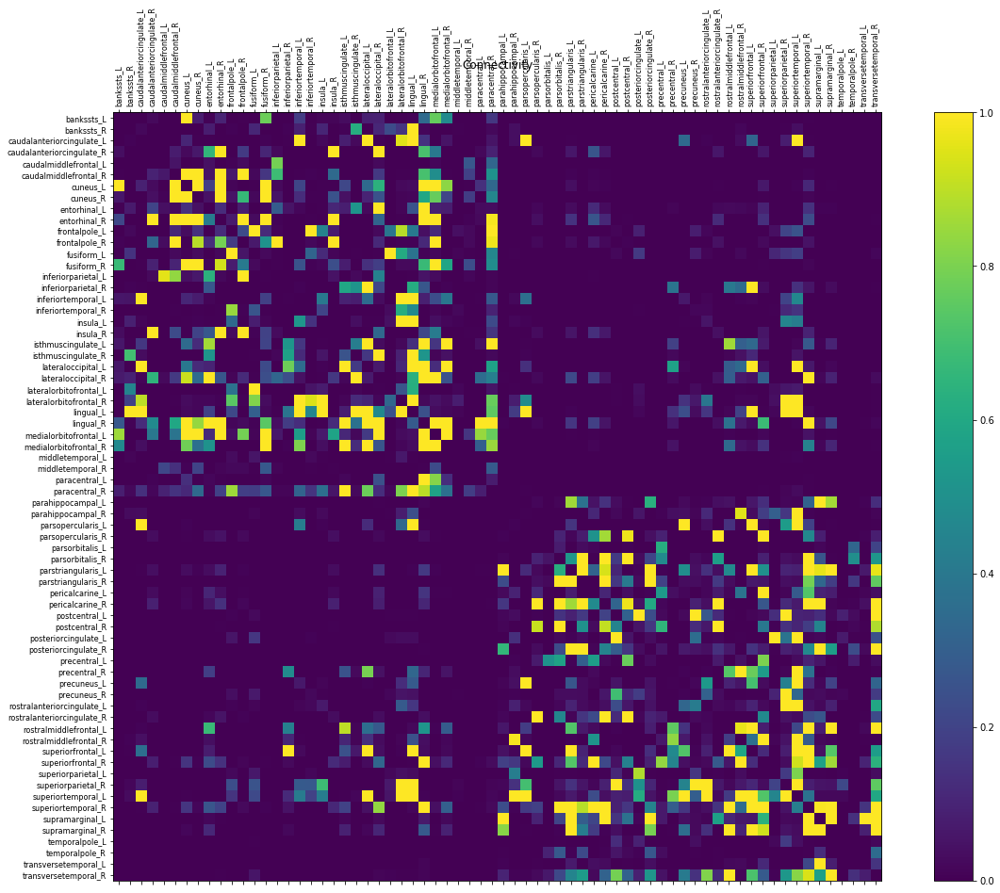

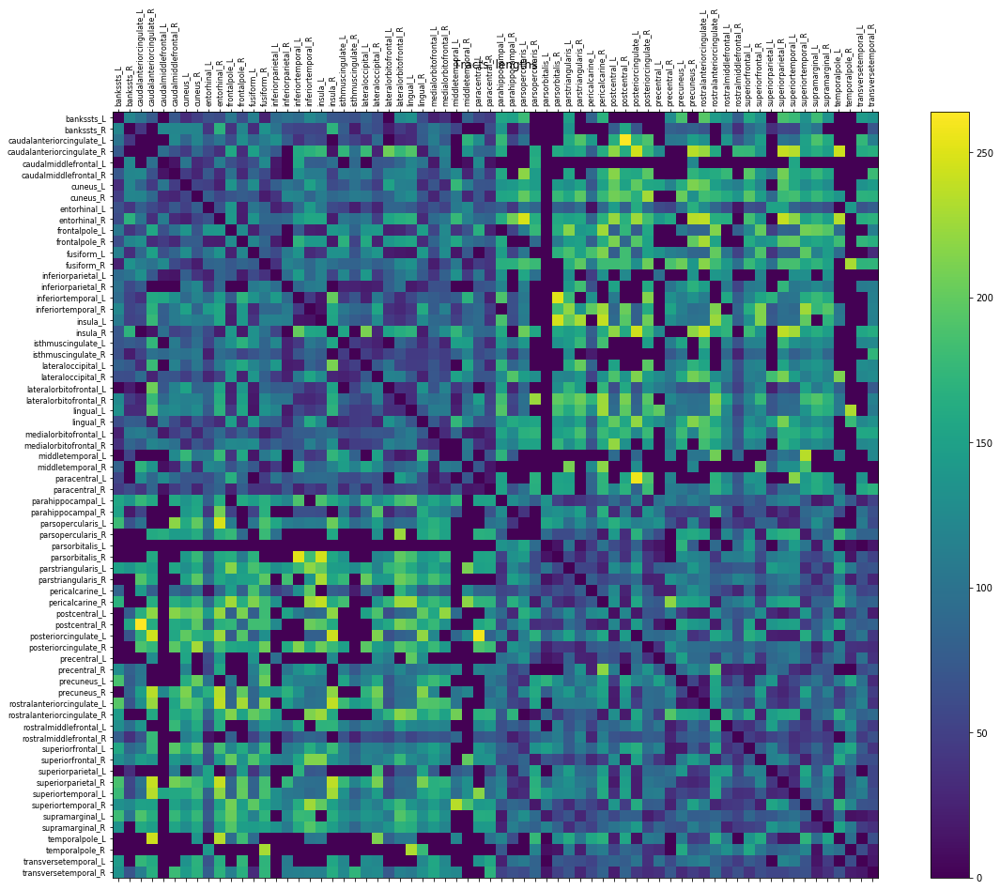

In [3]:
from tvb.simulator.models.wilson_cowan_constraint import WilsonCowan
from tvb_multiscale.core.tvb.simulator_builder import SimulatorBuilder


model_params = {
        "r_e": np.array([0.0]),
        "r_i": np.array([0.0]),
        "k_e": np.array([1.0]),
        "k_i": np.array([1.0]),
        "tau_e": np.array([10.0]),
        "tau_i": np.array([10.0]),
        "c_ee": np.array([10.0]),
        "c_ei": np.array([6.0]),
        "c_ie": np.array([10.0]),
        "c_ii": np.array([1.0]),
        "alpha_e": np.array([1.2]),
        "alpha_i": np.array([2.0]),
        "a_e": np.array([1.0]),
        "a_i": np.array([1.0]),
        "b_e": np.array([0.0]),
        "b_i": np.array([0.0]),
        "c_e": np.array([1.0]),
        "c_i": np.array([1.0]),
        "theta_e": np.array([2.0]),
        "theta_i": np.array([3.5]),
        "P": np.array([0.5]),
        "Q": np.array([0.0])
    }

# ----------------------1. Build a TVB simulator (model, integrator, monitors...)----------------------------------
simulator_builder = SimulatorBuilder()
simulator_builder.connectivity = config.DEFAULT_CONNECTIVITY_ZIP
simulator_builder.model = WilsonCowan

simulator = simulator_builder.build(**model_params)


# Optionally modify the default configuration:

# # ----------------------------------------------------------------------------------------------------------------
# # ----Uncomment below to modify the simulator by changing the default options:--------------------------------------
# # ----------------------------------------------------------------------------------------------------------------

# from tvb.datatypes.connectivity import Connectivity
# from tvb.simulator.cosimulator import CoSimulator
# from tvb.simulator.integrators import HeunStochastic
# from tvb.simulator.monitors import Raw  # , Bold, EEG
    
# # Load connectivity
# connectivity = Connectivity.from_file(config.DEFAULT_CONNECTIVITY_ZIP)
# # Normalize connectivity weights
# connectivity.weights = connectivity.scaled_weights(mode="region")
# connectivity.weights /= np.percentile(connectivity.weights, 95)
# connectivity.weights[connectivity.weights>1.0] = 1.0
# connectivity.configure()

# # Create a TVB simulator and set all desired inputs
# # (connectivity, model, surface, stimuli etc)
# # We choose all defaults in this example
# simulator = Simulator()
# simulator.model = WilsonCowan(**model_params)

# simulator.connectivity = connectivity

# simulator.integrator = HeunStochastic()
# simulator.integrator.dt = 0.1
# simulator.integrator.noise.nsig = np.array([0.001])

# mon_raw = Raw(period=1.0)  # ms
# simulator.monitors = (mon_raw, )

# # ----------------------------------------------------------------------------------------------------------------
# # ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# # ----------------------------------------------------------------------------------------------------------------

plotter.plot_tvb_connectivity(simulator.connectivity);

## 2. Build and connect the NEST network model <br> (networks of spiking neural populations for fine-scale <br>regions, stimulation devices, spike recorders etc)

In [4]:
# Select the regions for the fine scale modeling with NEST spiking networks
number_of_regions = simulator.connectivity.region_labels.shape[0]
nest_nodes_ids = []  # the indices of fine scale regions modeled with NEST
# We model parahippocampal cortices (left and right) with NEST
for id in range(number_of_regions):
    if simulator.connectivity.region_labels[id].find("hippo") > 0:
        nest_nodes_ids.append(id)
        
from tvb_multiscale.tvb_nest.nest_models.builders.models.wilson_cowan import WilsonCowanBuilder

# Build a NEST network model with the corresponding builder
nest_model_builder = WilsonCowanBuilder(simulator, nest_nodes_ids, config=config, set_defaults=False)


N_E = int(nest_model_builder.population_order * nest_model_builder.scale_e)
N_I = int(nest_model_builder.population_order * nest_model_builder.scale_i)


# # Using all default parameters for this example
# nest_model_builder.set_defaults()

# or...

# ----------------------------------------------------------------------------------------------------------------
# ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# ----------------------------------------------------------------------------------------------------------------

population_neuron_model = "iaf_cond_alpha"

nest_model_builder.population_order = 100

nest_model_builder.scale_e = 1.0
nest_model_builder.scale_i = 1.0

N_E = int(nest_model_builder.population_order * nest_model_builder.scale_e)
N_I = int(nest_model_builder.population_order * nest_model_builder.scale_i)

nest_model_builder.global_coupling_scaling = nest_model_builder.tvb_simulator.coupling.a[0].item() 

# When any of the properties model, params and scale below depends on regions,
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property

w_ee = nest_model_builder.tvb_model.c_ee[0].item()
w_ei = nest_model_builder.tvb_model.c_ei[0].item()
w_ie = nest_model_builder.tvb_model.c_ie[0].item()
w_ii = nest_model_builder.tvb_model.c_ii[0].item()


# Populations' configurations
# When any of the properties model, params and scale below depends on regions,
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property
nest_model_builder.populations = [
    {"label": "E", "model": population_neuron_model,
      "params": {}, "nodes": None,  # None means "all"
     "scale": nest_model_builder.scale_e},
    {"label": "I", "model": population_neuron_model,
     "params": {}, "nodes": None,  # None means "all"
     "scale": nest_model_builder.scale_i}
  ]

# Within region-node connections
# When any of the properties model, conn_spec, weight, delay, receptor_type below
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property

synapse_model = "static_synapse"
conn_spec = {"allow_autapses": True, 'allow_multapses': True, 'rule': "all_to_all",
             "indegree": None, "outdegree": None, "N": None, "p": 0.1}


within_node_delay = {"distribution": "uniform", 
                     "low": np.minimum(nest_model_builder.default_min_delay, 
                                       nest_model_builder.default_populations_connection["delay"]), 
                     "high": np.maximum(nest_model_builder.tvb_dt, 
                                        2*nest_model_builder.default_populations_connection["delay"])}

nest_model_builder.populations_connections = [
     #              ->
    {"source": "E", "target": "E",  # E -> E This is a self-connection for population "E"
     "synapse_model": synapse_model, "conn_spec": conn_spec,
     "weight": {"distribution": "normal", "mu": w_ee, "sigma": 0.1*w_ee},
     "delay": within_node_delay,
     "receptor_type": 0, "nodes": None},  # None means apply to all
    {"source": "E", "target": "I",  # E -> I
     "synapse_model": synapse_model, "conn_spec": conn_spec,
     "weight": {"distribution": "normal", "mu": w_ei, "sigma": 0.1*w_ei},
     "delay": within_node_delay,
     "receptor_type": 0, "nodes": None},  # None means apply to all
    {"source": "I", "target": "E",  # I -> E
     "synapse_model": synapse_model,
     "conn_spec": conn_spec, "weight": {"distribution": "normal", "mu": -w_ie, "sigma": 0.1*w_ie},
     "delay": within_node_delay,
     "receptor_type": 0, "nodes": None},  # None means apply to all
    {"source": "I", "target": "I",  # I -> I This is a self-connection for population "I"
     "synapse_model": synapse_model, "conn_spec": conn_spec,
     "weight": {"distribution": "normal", "mu": -w_ii, "sigma": 0.1*w_ii},
     "delay": within_node_delay,
     "receptor_type": 0, "nodes": None}  # None means apply to all
    ]


# Among/Between region-node connections
# Given that only the AMPA population of one region-node couples to
# all populations of another region-node,
# we need only one connection type
        
# When any of the properties model, conn_spec, weight, delay, receptor_type below
# depends on regions, set a handle to a function with
# arguments (source_region_index=None, target_region_index=None)

from tvb_multiscale.tvb_nest.nest_models.builders.nest_templates \
    import random_normal_tvb_weight, random_uniform_tvb_delay
    
# Total excitatory spikes of one region node will be distributed to
nest_model_builder.nodes_connections = [
    #              ->
    {"source": "E", "target": ["E"],
     "synapse_model": synapse_model, "conn_spec": conn_spec,
     "weight": lambda source_node, target_node: 
                 random_normal_tvb_weight(source_node, target_node, nest_model_builder.tvb_weights, 
                                          scale=nest_model_builder.global_coupling_scaling, sigma=0.1),
     "delay": lambda source_node, target_node: \
                 random_uniform_tvb_delay(source_node, target_node, nest_model_builder.tvb_delays, 
                                          low=nest_model_builder.tvb_dt, 
                                          high=2*nest_model_builder.tvb_dt, 
                                          sigma=0.1),  
     "receptor_type": 0,
     "source_nodes": None, "target_nodes": None}  # None means apply to all
    ]

# Creating  devices to be able to observe NEST activity:

nest_model_builder.output_devices = []

connections = OrderedDict({})
#          label <- target population
connections["E_spikes"] = "E"
connections["I_spikes"] = "I"
nest_model_builder.output_devices.append(
    {"model": "spike_recorder", "params": {"record_to": "memory"},
     "connections": connections, "nodes": None})  # None means apply to "all"

# Labels have to be different

connections = OrderedDict({})
#               label    <- target population
connections["E"] = "E"
connections["I"] = "I"
params = {'record_from': ["V_m"], "interval": 1.0, "record_to": "memory"}
nest_model_builder.output_devices.append(
    {"model": "multimeter", "params": params,
     "connections": connections, "nodes": None})  # None means apply to all
    

# Create a spike stimulus input device
nest_model_builder.input_devices = [
    {"model": "poisson_generator",
     "params": {"rate": 6400.0, "origin": 0.0, "start": 0.1},  # "stop": 100.0
     "connections": {"Stimulus": ["E"]}, 
     "nodes": None,         # None means apply to all
     "weights": {"distribution": "normal", "mu": 1.0, "sigma": 0.1}, 
     "delays": {"distribution": "uniform", 
                "low": nest_model_builder.tvb_dt, 
                "high": 2*nest_model_builder.tvb_dt},
     "receptor_type": 0}
                                  ]  #

# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

nest_network = nest_model_builder.build_spiking_network()


2021-01-08 16:28:33,893 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - Loading a NEST instance...
2021-01-08 16:28:33,893 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - Loading a NEST instance...
2021-01-08 16:28:33,897 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2021-01-08 16:28:33,897 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2021-01-08 16:28:33,900 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2021-01-08 16:28:33,900 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2021-01-08 16:28:33,905 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_DOC_DIR: /home/docker/env/neurosci/nest_build/share/doc/nest
2021-01-08 16:28:33,905 - INFO - tvb_multiscale.t

2021-01-08 16:28:34,147 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for E_spikes created!
2021-01-08 16:28:34,147 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for E_spikes created!
2021-01-08 16:28:34,205 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for I_spikes created!
2021-01-08 16:28:34,205 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for I_spikes created!
2021-01-08 16:28:34,269 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model multimeter for E created!
2021-01-08 16:28:34,269 - INFO - tvb_multiscale.core.spiking_models.devices 

In [5]:
print(nest_network.print_str(connectivity=True))


----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
NESTNetwork:

----------------------------------------------------------------------------------------------------

SpikingBrain - Regions: ['parahippocampal_L', 'parahippocampal_R']
Regions' nodes:


----------------------------------------------------------------------------------------------------
NESTRegionNode - Label: parahippocampal_L
Populations ['E', 'I']:

----------------------------------------------------------------------------------------------------

NESTPopulation - Label: E 
model: iaf_cond_alpha
100 neurons: 1...100
parameters: {'archiver_length': 0, 'beta_Ca': array([0.001]), 'C_m': array([250.]), 'Ca': array([0.]), 'dg_ex': array([0.]), 'dg_in': array([0.]), 'E_L':

## 3. Build the TVB-NEST interface

In [6]:
from tvb_multiscale.tvb_nest.interfaces.builders.models.wilson_cowan import \
    WilsonCowanBuilder as InterfaceWilsonCowanBuilder

# Build a TVB-NEST interface with all the appropriate connections between the
# TVB and NEST modelled regions
tvb_nest_builder = \
    InterfaceWilsonCowanBuilder(simulator, nest_network, nest_nodes_ids, 
                                exclusive_nodes=True, populations_sizes=[N_E, N_I])

tvb_to_nest_mode="rate"
nest_to_tvb=True

# Using all default parameters for this example

# or...


# ----------------------------------------------------------------------------------------------------------------
# ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# ----------------------------------------------------------------------------------------------------------------

from tvb_multiscale.tvb_nest.nest_models.builders.nest_templates \
    import random_normal_tvb_weight, random_uniform_tvb_delay


# TVB -> NEST


# --------For spike transmission from TVB to NEST devices acting as TVB proxy nodes with TVB delays:--------


if tvb_to_nest_mode == "rate":
    # Mean spike rates are applied in parallel to all target neurons

    tvb_nest_builder.tvb_to_spikeNet_interfaces = [
        {"model": "inhomogeneous_poisson_generator",
         "params": {"allow_offgrid_times": False},
    # # ---------Properties potentially set as function handles with args (tvb_node_id=None)-------------------------
         "interface_weights": 1.0 * N_E, 
    # Applied outside NEST for each interface device
    # -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
        "weights": lambda tvb_node_id, nest_node_id: \
                            random_normal_tvb_weight(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_weights, 
                                                     scale=tvb_nest_builder.global_coupling_scaling, sigma=0.1),
        "delays": lambda tvb_node_id, nest_node_id: \
                        random_uniform_tvb_delay(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_delays,
                                                 low=tvb_nest_builder.tvb_dt, 
                                                 high=2*tvb_nest_builder.tvb_dt, 
                                                 sigma=0.1),
        "receptor_type": 0,
        # --------------------------------------------------------------------------------------------------------------
        #             TVB sv -> NEST population
        "connections": {"E": ["E"]},
        "source_nodes": None, "target_nodes": None}]  # None means all here

    
if nest_to_tvb:
    # NEST -> TVB:
    # Use S_e and S_i instead of r_e and r_i
    # for transmitting to the TVB state variables directly
    connections = OrderedDict()
    #            TVB <- NEST
    connections["Ein"] = ["E"]
    connections["Iin"] = ["I"]
    tvb_nest_builder.spikeNet_to_tvb_interfaces = [
        {"model": "spike_recorder", "params": {},
    # ------------------Properties potentially set as function handles with args (nest_node_id=None)--------------------
         "interface_weights": 1.0, "delays": 0.0,
    # -----------------------------------------------------------------------------------------------------------------
         "connections": connections, "nodes": None}]  # None means all here

    
# WilsonCowan model state variables are bounded in [0, 1],
# and have to be converted in Hz as poisson_generator assumes in NEST:
tvb_nest_builder.w_tvb_to_spike_rate = 1000.0
# We return from a NEST spike_detector the ratio number_of_population_spikes / number_of_population_neurons
# for every TVB time step, which is already a quantity in the range [0.0, 1.0],
# as long as a neuron cannot fire twice during a TVB time step, i.e.,
# as long as the TVB time step (usually 0.001 to 0.1 ms)
# is smaller than the neurons' refractory time, t_ref (usually 1-2 ms)
tvb_nest_builder.w_spikes_to_tvb = 1.0

# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

tvb_nest_model = tvb_nest_builder.build_interface(tvb_to_nest_mode=tvb_to_nest_mode, nest_to_tvb=nest_to_tvb)

2021-01-08 16:28:48,804 - INFO - tvb_multiscale.core.interfaces.base - <class 'tvb_multiscale.tvb_nest.interfaces.models.WilsonCowan'> created!
2021-01-08 16:28:48,804 - INFO - tvb_multiscale.core.interfaces.base - <class 'tvb_multiscale.tvb_nest.interfaces.models.WilsonCowan'> created!
2021-01-08 16:28:48,808 - INFO - tvb_multiscale.tvb_nest.interfaces.models - <class 'tvb_multiscale.tvb_nest.interfaces.models.WilsonCowan'> created!
2021-01-08 16:28:48,808 - INFO - tvb_multiscale.tvb_nest.interfaces.models - <class 'tvb_multiscale.tvb_nest.interfaces.models.WilsonCowan'> created!
2021-01-08 16:28:48,822 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model inhomogeneous_poisson_generator for E created!
2021-01-08 16:28:48,822 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model inhomogeneous_poisson_generator for E created!
2021-01-08 16:28:4

In [7]:
print(tvb_nest_model.print_str(detailed_output=True, connectivity=False))


----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
WilsonCowan TVB-NEST Interface


----------------------------------------------------------------------------------------------------


TVB to spikeNet interfaces:

----------------------------------------------------------------------------------------------------

Index: 0_E->['E']

TVBtoNESTInhomogeneousPoissonGeneratorInterface
Name: E, TVB state variable indice: 0, 
Interface weights: [100.0]
Source TVB nodes' indices:
0...33, 36...67 
Target NEST nodes' indices:
34...35 
TVBtoNESTInhomogeneousPoissonGeneratorInterface - Name: E, Model: inhomogeneous_poisson_generator,
Devices:
----------------------------------------------------------------------------------------------------

E_

## 4. Configure simulator, simulate, gather results

In [8]:
# Configure the simulator with the TVB-NEST interface...
simulator.configure(tvb_spikeNet_interface=tvb_nest_model)
# ...and simulate!
t = time.time()
simulation_length = 110.0 # 1100 for a more meaningful simulation
transient = simulation_length/11
results = simulator.run(simulation_length=simulation_length)
# Integrate NEST one more NEST time step so that multimeters get the last time point
# unless you plan to continue simulation later
simulator.run_spiking_simulator(simulator.tvb_spikeNet_interface.nest_instance.GetKernelStatus("resolution"))
print("\nSimulated in %f secs!" % (time.time() - t))

2021-01-08 16:28:50,084 - INFO - tvb.simulator.cosimulator - Region simulation with 68 ROI nodes
2021-01-08 16:28:50,088 - INFO - tvb.simulator.cosimulator - Memory requirement estimate: simulation will need about 4.5 MB
2021-01-08 16:28:50,094 - INFO - tvb.simulator.cosimulator - Preparing initial history of shape (880, 4, 68, 1) using model.initial()
2021-01-08 16:28:50,139 - INFO - tvb.simulator.cosimulator - Final initial history shape is (880, 4, 68, 1)
2021-01-08 16:28:50,143 - INFO - tvb.simulator.cosimulator - Memory requirement census: simulation will need about 1.8 MB
2021-01-08 16:28:50,145 - INFO - tvb.simulator.cosimulator - Simulation runtime should be about 1.966 seconds
2021-01-08 16:28:50,146 - INFO - tvb.simulator.cosimulator - Calculating storage requirement for ...
2021-01-08 16:28:50,148 - INFO - tvb.simulator.cosimulator - Calculated storage requirement for simulation: 2692800 
...10.0% done in 3.2 sec- INFO - tvb.simulator.cosimulator - 
...20.0% done in 6.4 sec-

In [9]:
# Clean-up NEST simulation
simulator.tvb_spikeNet_interface.nest_instance.Cleanup()


## 5. Plot results and write them to HDF5 files

In [10]:
# set to False for faster plotting of only mean field variables and dates, apart from spikes" rasters:
plot_per_neuron = True 
MAX_VARS_IN_COLS = 3
MAX_REGIONS_IN_ROWS = 10
MIN_REGIONS_FOR_RASTER_PLOT = 9
# from examples.plot_write_results import plot_write_results
# populations = []
# populations_sizes = []
# for pop in nest_model_builder.populations:
#     populations.append(pop["label"])
#     populations_sizes.append(int(np.round(pop["scale"] * nest_model_builder.population_order)))
# plot_write_results(results, simulator, populations=populations, populations_sizes=populations_sizes, 
#                    transient=transient, tvb_state_variable_type_label="State Variables", 
#                    tvb_state_variables_labels=simulator.model.variables_of_interest, 
#                    plot_per_neuron=plot_per_neuron, plotter=plotter, config=config)

In [11]:
# If you want to see what the function above does, take the steps, one by one
try:
    # We need framework_tvb for writing and reading from HDF5 files
    from tvb_multiscale.core.io.h5_writer import H5Writer
    writer = H5Writer()
except:
    writer = False
    
from tvb.contrib.scripts.datatypes.time_series import TimeSeriesRegion
from tvb.contrib.scripts.datatypes.time_series_xarray import TimeSeriesRegion as TimeSeriesXarray

# Put the results in a Timeseries instance
from tvb.contrib.scripts.datatypes.time_series import TimeSeriesRegion

source_ts = TimeSeriesXarray(  # substitute with TimeSeriesRegion fot TVB like functionality
        data=results[0][1], time=results[0][0]-results[0][0][0],
        connectivity=simulator.connectivity,
        labels_ordering=["Time", "State Variable", "Region", "Neurons"],
        labels_dimensions={"State Variable": list(simulator.model.variables_of_interest),
                           "Region": simulator.connectivity.region_labels.tolist()},
        sample_period=simulator.integrator.dt)
source_ts.configure()

t = source_ts.time
    
# Write to file
if writer:
    writer.write_tvb_to_h5(TimeSeriesRegion().from_xarray_DataArray(source_ts._data,
                                                                    connectivity=source_ts.connectivity),
                           os.path.join(config.out.FOLDER_RES, source_ts.title)+".h5")
source_ts

,value
Dimensions,"['Time', 'State Variable', 'Region', 'Neurons']"
Length,1100
Region Mapping,None
Region Mapping Volume,None
Sample period,0.1
Source Connectivity,Connectivity gid: 5b044639-ae21-4fcf-b52a-c389777bbb41
Time units,ms
Time-series name,Region Time Series
Time-series type,TimeSeriesRegion
"[min, median, max]","[0, 0.354645, 1]"


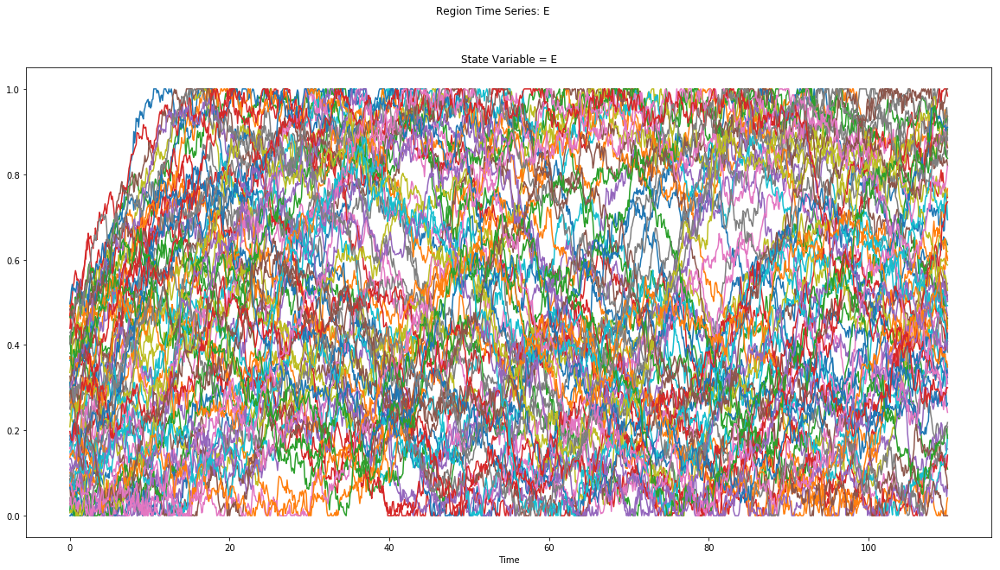

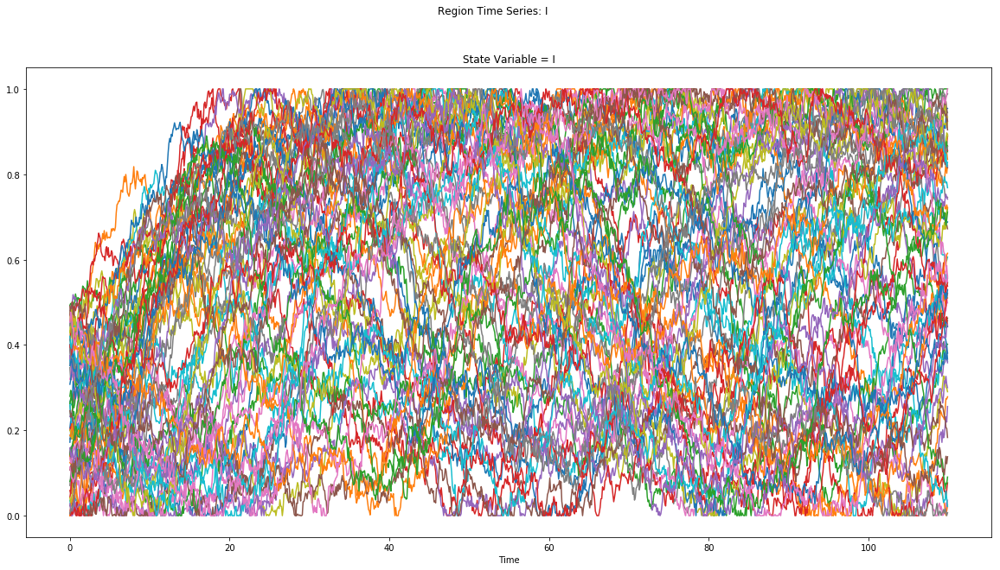

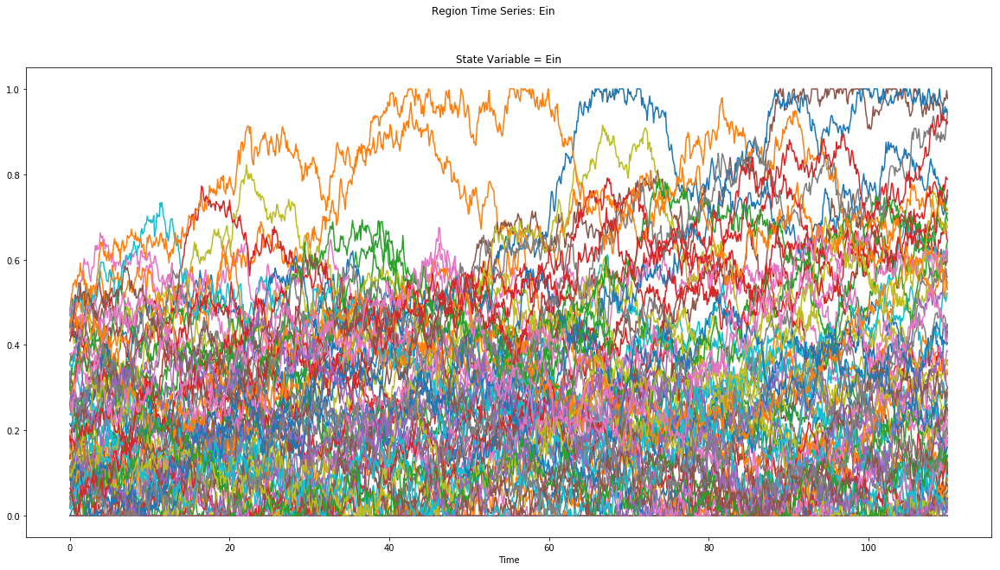

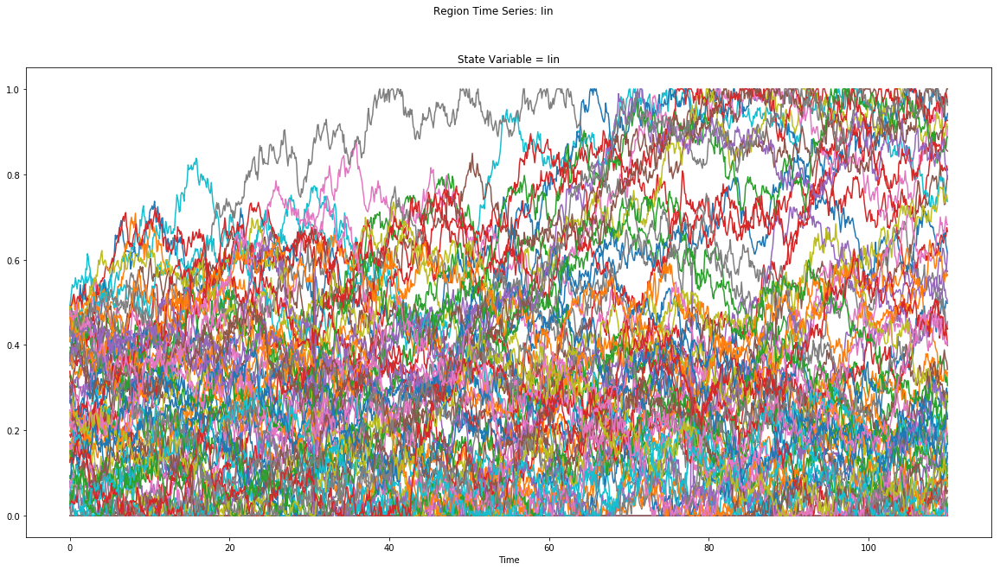

In [12]:
# Plot TVB time series
source_ts.plot_timeseries(plotter_config=plotter.config, 
                          hue="Region" if source_ts.shape[2] > MAX_REGIONS_IN_ROWS else None, 
                          per_variable=source_ts.shape[1] > MAX_VARS_IN_COLS, 
                          figsize=FIGSIZE);

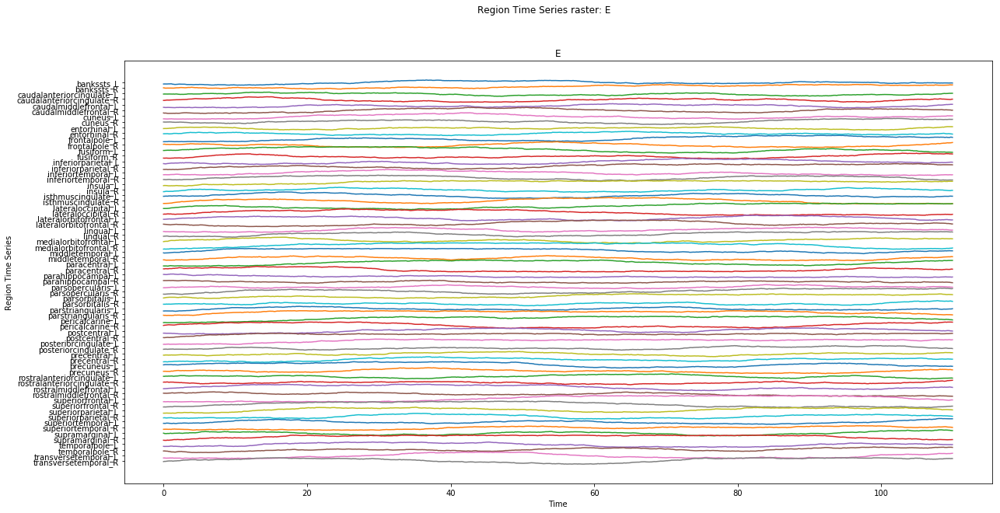

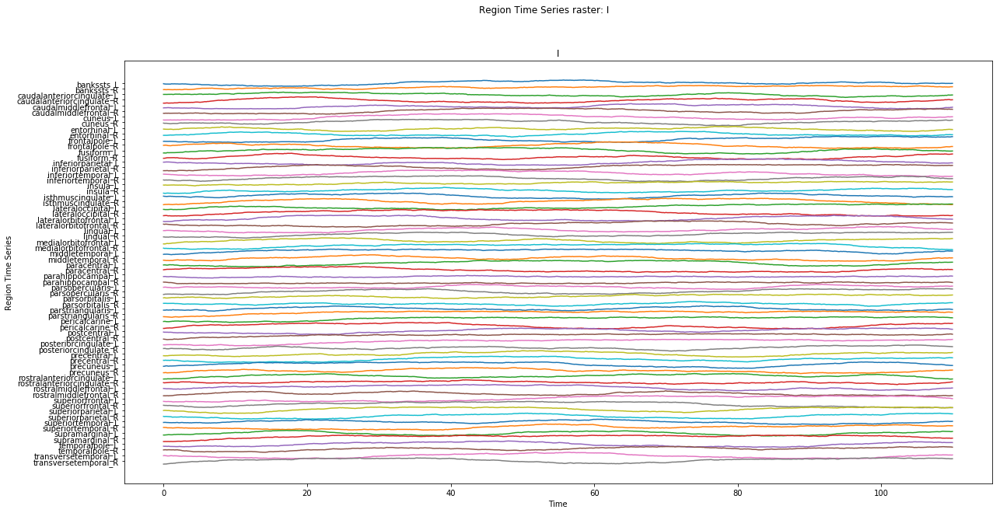

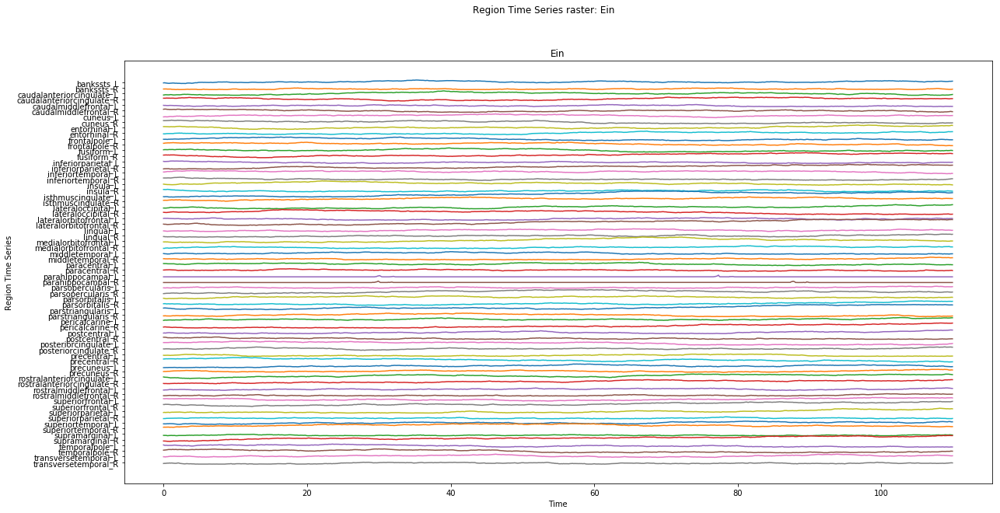

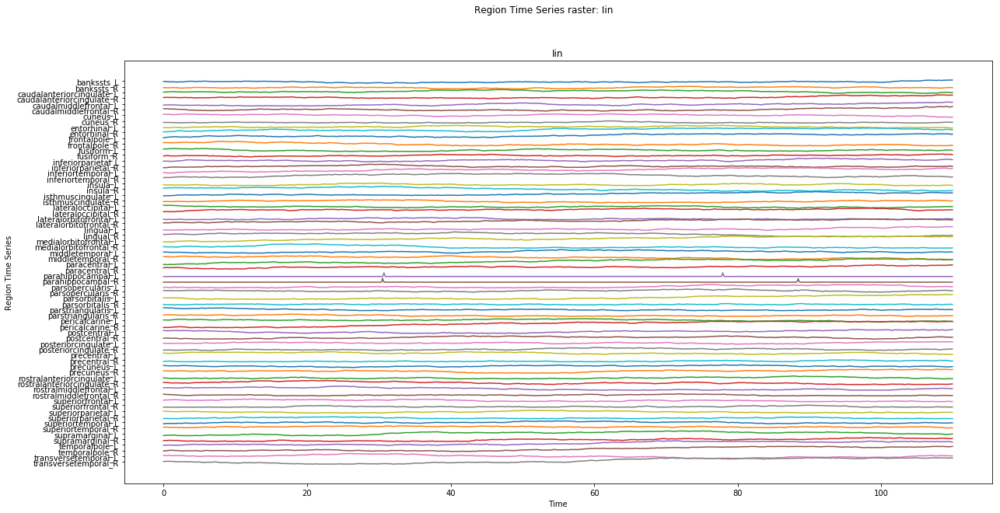

In [13]:
# TVB time series raster plot:
if source_ts.number_of_labels > MIN_REGIONS_FOR_RASTER_PLOT:
    source_ts.plot_raster(plotter_config=plotter.config, 
                          per_variable=source_ts.shape[1] > MAX_VARS_IN_COLS,
                          figsize=FIGSIZE);

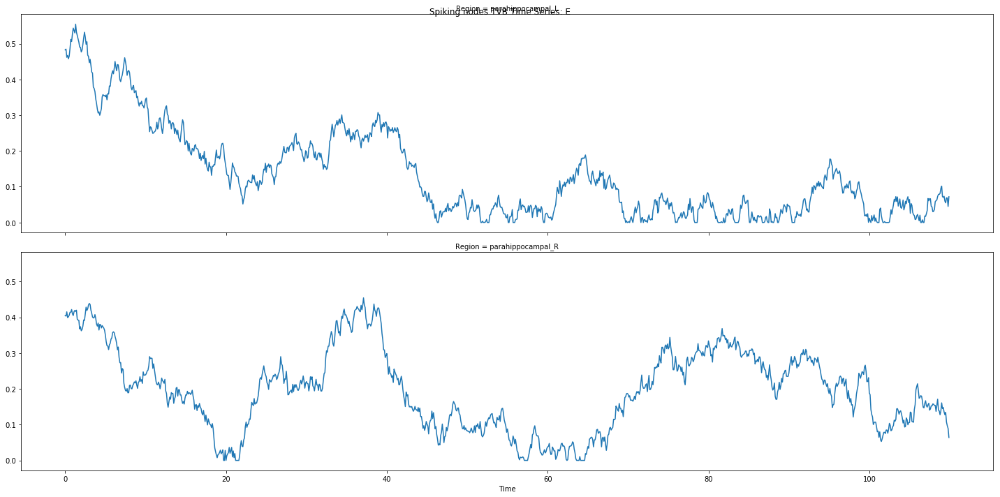

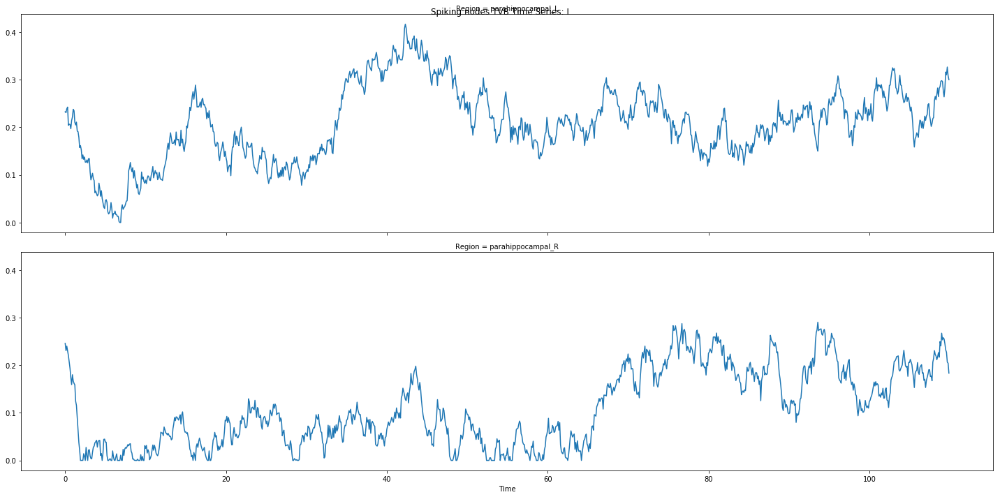

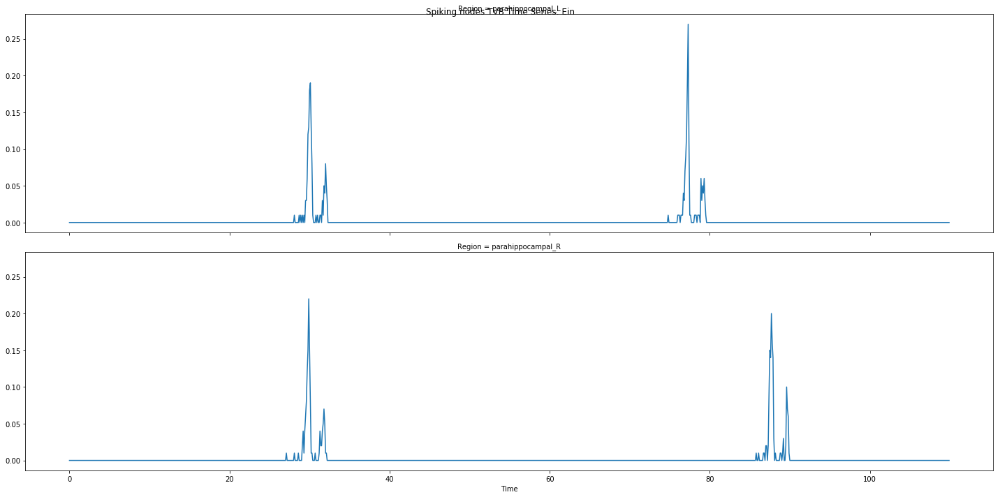

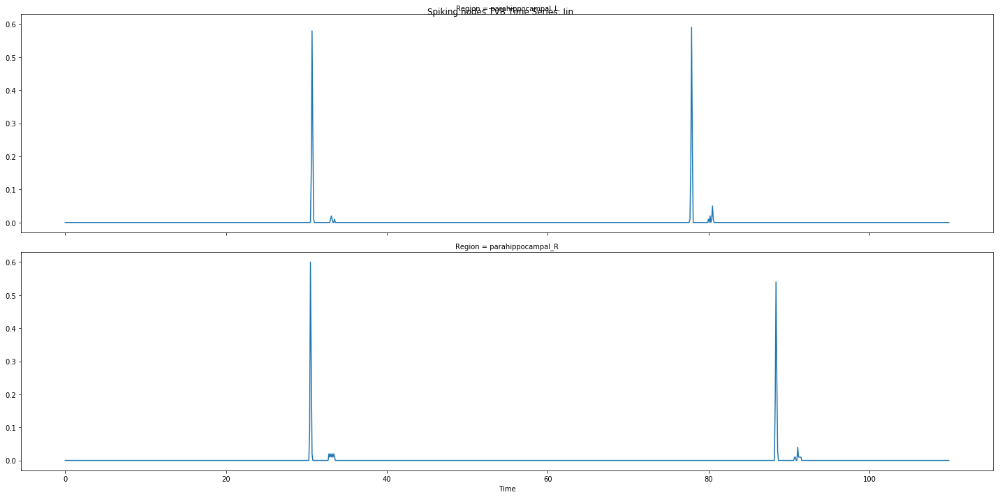

In [14]:
# Focus on the nodes modelled in NEST: 
n_spiking_nodes = len(simulator.tvb_spikeNet_interface.spiking_nodes_ids)
source_ts_nest = source_ts[:, :, simulator.tvb_spikeNet_interface.spiking_nodes_ids]
source_ts_nest.plot_timeseries(plotter_config=plotter.config, 
                               hue="Region" if source_ts_nest.shape[2] > MAX_REGIONS_IN_ROWS else None, 
                               per_variable=source_ts_nest.shape[1] > MAX_VARS_IN_COLS, 
                               figsize=FIGSIZE, figname="Spiking nodes TVB Time Series");

In [15]:
# Focus on the nodes modelled in NEST: raster plot
if source_ts_nest.number_of_labels > MIN_REGIONS_FOR_RASTER_PLOT:
    source_ts_nest.plot_raster(plotter_config=plotter.config, 
                               per_variable=source_ts_nest.shape[1] > MAX_VARS_IN_COLS,
                               figsize=FIGSIZE, figname="Spiking nodes TVB Time Series Raster");

### Spiking Network plots

In [16]:
from tvb_multiscale.tvb_elephant.spiking_network_analyser import SpikingNetworkAnalyser
# Create a SpikingNetworkAnalyzer:
spikeNet_analyzer = \
    SpikingNetworkAnalyser(spikeNet=nest_network,
                           start_time=source_ts.time[0], end_time=source_ts.time[-1], 
                           period=simulator.monitors[0].period, transient=transient,
                           time_series_output_type="TVB", return_data=True, 
                           force_homogeneous_results=True, connectivity=simulator.connectivity)

### Plot spikes' raster and mean spike rates and correlations

In [17]:
# Spikes rates and correlations per Population and Region
spikes_res = \
    spikeNet_analyzer.\
        compute_spikeNet_spikes_rates_and_correlations(
            populations_devices=None, regions=None,
            rates_methods=[], rates_kwargs=[{}],rate_results_names=[],
            corrs_methods=[], corrs_kwargs=[{}], corrs_results_names=[], bin_kwargs={},
            data_method=spikeNet_analyzer.get_spikes_from_device, data_kwargs={},
            return_devices=False
        );

/home/docker/env/neurosci/lib/python3.7/site-packages/elephant/conversion.py:848: UserWarning:Binning discarded 1 last spike(s) of the input spiketrain


<xarray.DataArray "Mean Populations' Spikes' Rates" (Population: 2, Region: 2)>
array([[26.92692639, 26.92692639],
       [21.52152109, 22.22222178]])
Coordinates:
  * Region      (Region) object 'parahippocampal_L' 'parahippocampal_R'
  * Population  (Population) object 'E_spikes' 'I_spikes'
<xarray.DataArray "Populations' Correlation Coefficient" (Population_i: 2, Population_j: 2, Region_i: 2, Region_j: 2)>
array([[[[ 1.        ,  0.52070924],
         [ 0.52070924,  1.        ]],

        [[-0.01072206, -0.00186611],
         [ 0.00395271, -0.0077983 ]]],


       [[[-0.01072206,  0.00395271],
         [-0.00186611, -0.0077983 ]],

        [[ 1.        ,  0.11888679],
         [ 0.11888679,  1.        ]]]])
Coordinates:
  * Population_i  (Population_i) object 'E_spikes' 'I_spikes'
  * Region_i      (Region_i) object 'parahippocampal_L' 'parahippocampal_R'
  * Population_j  (Population_j) object 'E_spikes' 'I_spikes'
  * Region_j      (Region_j) object 'parahippocampal_L' 'parahippoc

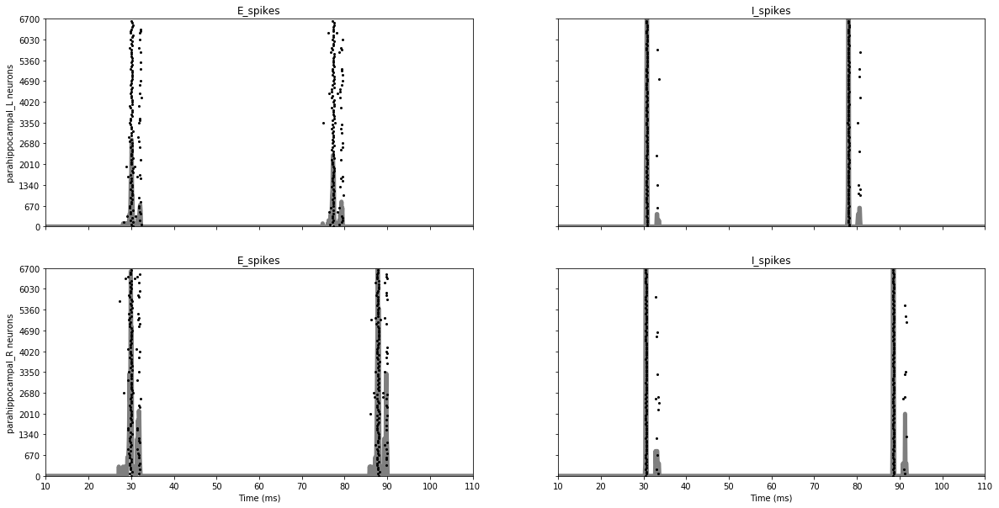

<Figure size 432x288 with 0 Axes>

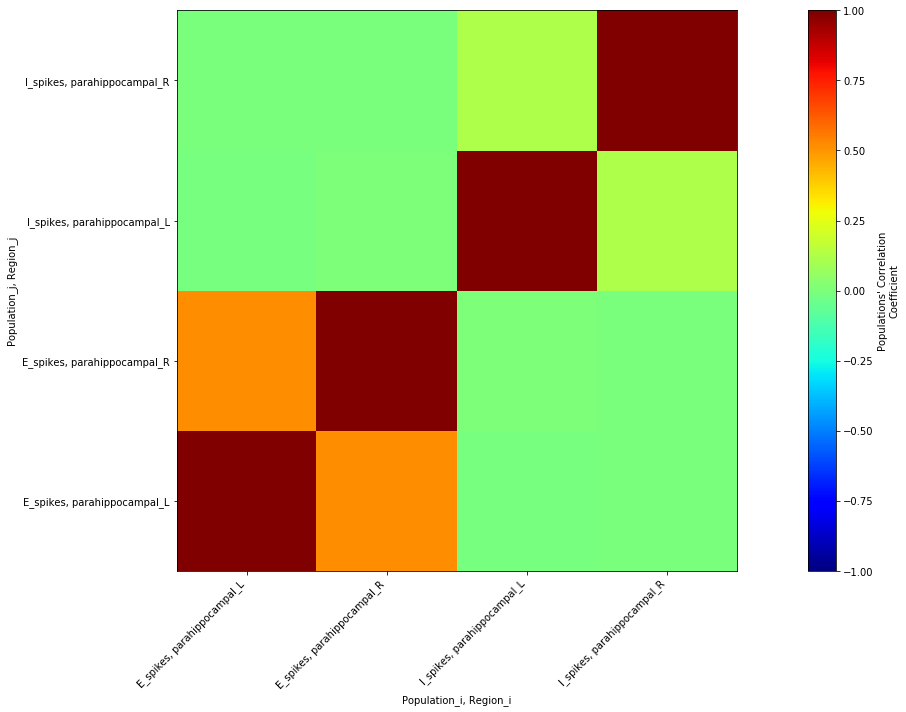

In [18]:
if spikes_res:
    print(spikes_res["mean_rate"])
    print(spikes_res["spikes_correlation_coefficient"])
    # Plot spikes' rasters together with mean population's spikes' rates' time series
    if plotter:
        plotter.plot_spike_events(spikes_res["spikes"], rates=spikes_res["mean_rate_time_series"], figsize=FIGSIZE)
        from tvb_multiscale.core.plot.correlations_plot import plot_correlations
        plot_correlations(spikes_res["spikes_correlation_coefficient"], plotter)

In [19]:
if spikes_res and writer:
    writer.write_object(spikes_res["spikes"].to_dict(), 
                        path=os.path.join(config.out.FOLDER_RES,  "Spikes") + ".h5");
    writer.write_object(spikes_res["mean_rate"].to_dict(),
                        path=os.path.join(config.out.FOLDER_RES,
                                          spikes_res["mean_rate"].name) + ".h5");
    writer.write_tvb_to_h5(TimeSeriesRegion().from_xarray_DataArray(
                              spikes_res["mean_rate_time_series"]._data,
                               connectivity=spikes_res["mean_rate_time_series"].connectivity),
                           os.path.join(config.out.FOLDER_RES,
                                        spikes_res["mean_rate_time_series"].title) + ".h5",
                           recursive=False);
    writer.write_object(spikes_res["spikes_correlation_coefficient"].to_dict(),
                        path=os.path.join(config.out.FOLDER_RES,
                                          spikes_res["spikes_correlation_coefficient"].name) + ".h5");

2021-01-08 16:29:38,842 - INFO - tvb_multiscale.core.io.h5_writer - Starting to write dict to: /home/docker/packages/tvb-multiscale/docs/documented_example_notebooks/outputs/WilsonCowan/res/Spikes.h5
2021-01-08 16:29:38,842 - INFO - tvb_multiscale.core.io.h5_writer - Starting to write dict to: /home/docker/packages/tvb-multiscale/docs/documented_example_notebooks/outputs/WilsonCowan/res/Spikes.h5
2021-01-08 16:29:38,866 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/E_spikes/parahippocampal_L" (2 members)> dataset <class 'numpy.ndarray'> senders:
[  3  30   6  25  44  10  11  51  87  42  59  15  69  91   4  52  94   8
  39  50   7  19  22  26  53  58  65  77  95  13  36  55  80  85  96  24
  33  35  70  71  89 100  12  43  46  64  66  67  78  83  86   2  23  31
  32  45  48  49  63  84  14  16  21  54  60  61  72  73  92   5  17  37
  38  40  68  74  76  90  97  28  41  56  57  62  79  81  82  88  99  18
  20  75   1   9  27  34  47  93  98  29   3  30

2021-01-08 16:29:38,891 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/E_spikes/parahippocampal_R" (2 members)> dataset <class 'numpy.ndarray'> times:
[27.2  28.15 28.7  29.15 29.2  29.25 29.25 29.3  29.3  29.4  29.45 29.45
 29.5  29.5  29.55 29.55 29.55 29.6  29.6  29.6  29.65 29.65 29.65 29.65
 29.7  29.7  29.7  29.7  29.75 29.75 29.75 29.75 29.75 29.75 29.75 29.75
 29.8  29.8  29.8  29.8  29.85 29.85 29.85 29.85 29.85 29.85 29.85 29.9
 29.9  29.9  29.9  29.9  29.9  29.9  29.9  29.95 29.95 29.95 29.95 29.95
 29.95 29.95 29.95 29.95 29.95 29.95 29.95 29.95 29.95 30.   30.   30.
 30.   30.   30.   30.   30.   30.05 30.05 30.05 30.05 30.05 30.05 30.05
 30.1  30.1  30.1  30.1  30.1  30.1  30.1  30.1  30.15 30.15 30.15 30.15
 30.15 30.15 30.2  30.2  30.25 30.35 30.8  31.25 31.35 31.4  31.4  31.4
 31.45 31.5  31.6  31.6  31.65 31.7  31.7  31.7  31.75 31.75 31.75 31.8
 31.8  31.85 31.85 31.85 31.85 31.85 31.9  31.9  31.95 31.95 31.95 31.95
 32.   32.05 32.1

2021-01-08 16:29:38,917 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/I_spikes/parahippocampal_R" (2 members)> dataset <class 'numpy.ndarray'> senders:
[357 301 319 338 368 379 384 386 395 304 307 310 311 326 328 329 330 334
 336 340 346 366 367 371 374 382 387 394 396 399 400 302 305 306 308 312
 314 320 322 323 324 331 333 337 342 343 344 345 347 348 350 352 353 354
 355 356 359 363 370 372 373 377 378 380 388 390 391 392 398 309 313 316
 318 321 325 332 349 351 358 360 362 364 365 369 381 383 397 303 315 317
 327 339 341 361 375 376 385 389 335 393 338 387 304 319 368 370 311 350
 302 333 339 336 301 319 338 357 384 304 326 328 330 334 336 345 368 386
 394 395 396 400 307 310 311 312 314 324 325 337 340 347 348 354 355 359
 366 371 372 374 379 382 387 388 390 399 306 313 316 320 321 322 323 329
 331 332 333 342 343 344 346 352 353 356 360 363 365 367 370 373 377 378
 380 391 397 398 302 303 305 308 309 315 317 318 327 350 351 358 361 362
 369 376 3

2021-01-08 16:29:38,993 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/coords/Region" (2 members)> dataset <class 'numpy.ndarray'> dims:
['Region'] !

2021-01-08 16:29:38,996 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/coords/Region" (2 members)> dataset <class 'numpy.ndarray'> data:
['parahippocampal_L' 'parahippocampal_R'] !

2021-01-08 16:29:38,996 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/coords/Region" (2 members)> dataset <class 'numpy.ndarray'> data:
['parahippocampal_L' 'parahippocampal_R'] !

2021-01-08 16:29:39,002 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'tuple'> dims to h5 file as a numpy array dataset !

2021-01-08 16:29:39,002 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'tuple'> dims to h5 file as a numpy array dataset !

2021-01-08 16:29:39,005 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'list'> data to 

2021-01-08 16:29:39,254 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/coords/Population_j" (2 members)> dataset <class 'numpy.ndarray'> dims:
['Population_j'] !

2021-01-08 16:29:39,258 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/coords/Population_j" (2 members)> dataset <class 'numpy.ndarray'> data:
['E_spikes' 'I_spikes'] !

2021-01-08 16:29:39,258 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/coords/Population_j" (2 members)> dataset <class 'numpy.ndarray'> data:
['E_spikes' 'I_spikes'] !

2021-01-08 16:29:39,263 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'tuple'> dims to h5 file as a numpy array dataset !

2021-01-08 16:29:39,263 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'tuple'> dims to h5 file as a numpy array dataset !

2021-01-08 16:29:39,267 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'list'> data to h5 file as a

### Get  SpikingNetwork mean field variable time series and plot them

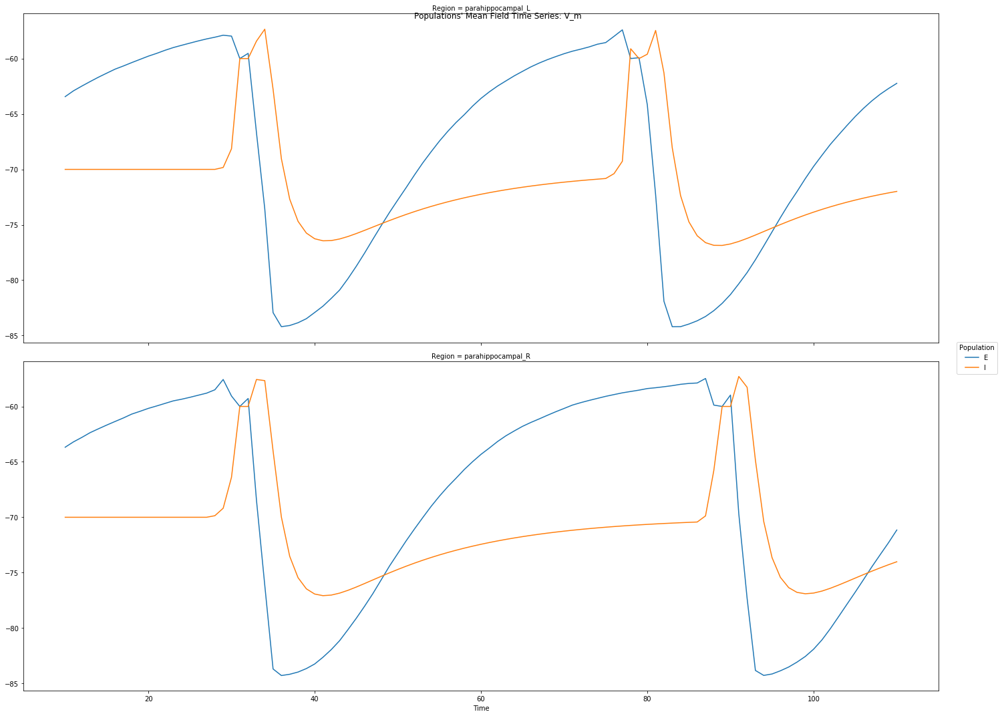

In [20]:
# Continuous time variables' data of spiking neurons
if plot_per_neuron:
    spikeNet_analyzer.return_data = True
else:
    spikeNet_analyzer.return_data = False
spikeNet_ts = \
    spikeNet_analyzer. \
         compute_spikeNet_mean_field_time_series(populations_devices=None, regions=None, variables=None,
                                                 computations_kwargs={}, data_kwargs={}, return_devices=False)
if spikeNet_ts:
    if plot_per_neuron:
        mean_field_ts = spikeNet_ts["mean_field_time_series"]  # mean field
        spikeNet_ts = spikeNet_ts["data_by_neuron"]  # per neuron data
    else:
        mean_field_ts = spikeNet_ts
        spikeNet_ts = None
    if mean_field_ts and mean_field_ts.size > 0:
        mean_field_ts.plot_timeseries(plotter_config=plotter.config, 
                                      per_variable=mean_field_ts.shape[1] > MAX_VARS_IN_COLS)
        if mean_field_ts.number_of_labels > MIN_REGIONS_FOR_RASTER_PLOT:
            mean_field_ts.plot_raster(plotter_config=plotter.config, 
                                      per_variable=mean_field_ts.shape[1] > MAX_VARS_IN_COLS,
                                      linestyle="--", alpha=1.0, linewidth=0.5)
else:
    mean_field_ts = None

In [21]:
# Write results to file:
if mean_field_ts and writer:
    writer.write_tvb_to_h5(TimeSeriesRegion().from_xarray_DataArray(
                                       mean_field_ts._data,
                                       connectivity=mean_field_ts.connectivity),
                           os.path.join(config.out.FOLDER_RES, mean_field_ts.title) + ".h5", 
                           recursive=False)

### Compute per neuron spikes' rates times series and plot them

<Figure size 432x288 with 0 Axes>

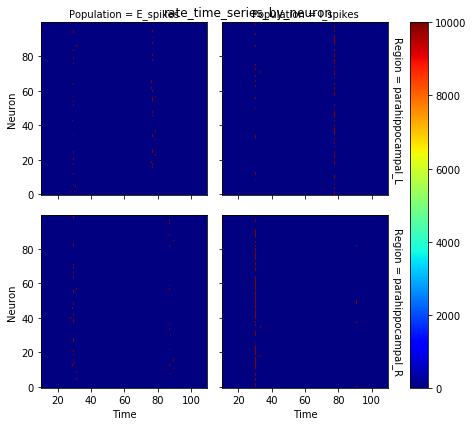

In [22]:
if spikes_res and plot_per_neuron:
    from tvb.simulator.plot.base_plotter import pyplot
    spikeNet_analyzer.return_data = False
    rates_ts_per_neuron = \
        spikeNet_analyzer. \
            compute_spikeNet_rates_time_series(populations_devices=None, regions=None,
                                               computations_kwargs={}, data_kwargs={},
                                               return_spikes_trains=False, return_devices=False);
    if rates_ts_per_neuron is not None and rates_ts_per_neuron.size:
        # Regions in rows
        row = rates_ts_per_neuron.dims[2] if rates_ts_per_neuron.shape[2] > 1 else None
        if row is None:
            # Populations in rows
            row = rates_ts_per_neuron.dims[1] if rates_ts_per_neuron.shape[1] > 1 else None
            col = None
        else:
            # Populations in columns
            col = rates_ts_per_neuron.dims[1] if rates_ts_per_neuron.shape[1] > 1 else None
        pyplot.figure()
        rates_ts_per_neuron.plot(y=rates_ts_per_neuron.dims[3], row=row, col=col, cmap="jet")
        plotter.base._save_figure(figure_name="Spike rates per neuron")
        # del rates_ts_per_neuron # to free memory

### Plot per neuron SpikingNetwork time series

<Figure size 432x288 with 0 Axes>

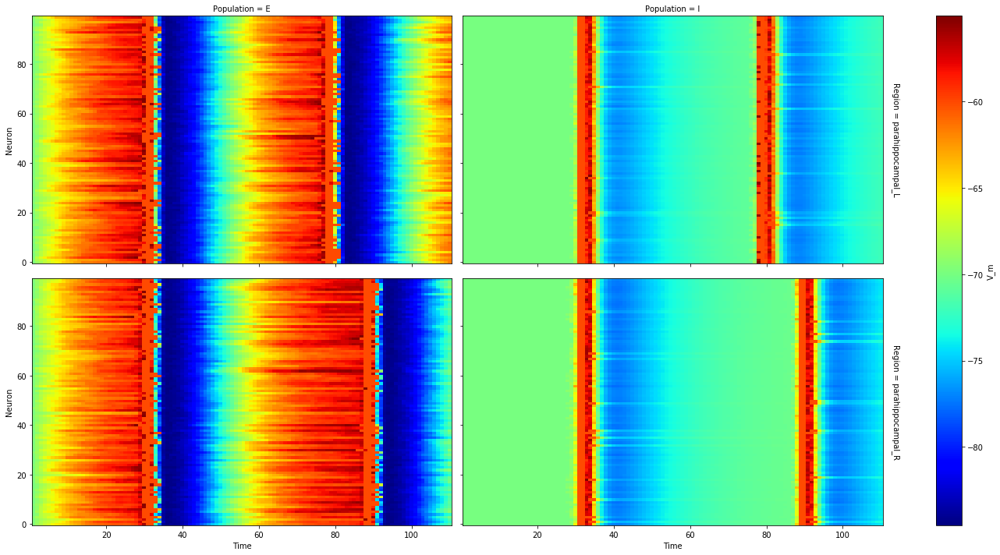

In [23]:
# Regions in rows
if spikeNet_ts is not None and spikeNet_ts.size:
    row = spikeNet_ts.dims[2] if spikeNet_ts.shape[2] > 1 else None
    if row is None:
        # Populations in rows
        row = spikeNet_ts.dims[3] if spikeNet_ts.shape[3] > 1 else None
        col = None
    else:
        # Populations in cols
         col = spikeNet_ts.dims[3] if spikeNet_ts.shape[3] > 1 else None
    for var in spikeNet_ts.coords[spikeNet_ts.dims[1]]:
        this_var_ts = spikeNet_ts.loc[:, var, :, :, :]
        this_var_ts.name = var.item()
        pyplot.figure()
        this_var_ts.plot(y=spikeNet_ts.dims[4], row=row, col=col, cmap="jet", figsize=FIGSIZE)
        plotter.base._save_figure(
            figure_name="Spiking Network variables' time series per neuron: %s" % this_var_ts.name)
    del spikeNet_ts # to free memory

# References

1 Paula Sanz Leon, Stuart A. Knock, M. Marmaduke Woodman, Lia Domide, <br>
  Jochen Mersmann, Anthony R. McIntosh, Viktor Jirsa (2013) <br>
  The Virtual Brain: a simulator of primate brain network dynamics. <br>
  Frontiers in Neuroinformatics (7:10. doi: 10.3389/fninf.2013.00010) <br>
  https://www.thevirtualbrain.org/tvb/zwei <br>
  https://github.com/the-virtual-brain <br>

2 Ritter P, Schirner M, McIntosh AR, Jirsa VK. 2013.  <br>
  The Virtual Brain integrates computational modeling  <br>
  and multimodal neuroimaging. Brain Connectivity 3:121–145. <br>

3 Meffin H, Burkitt AN, Grayden DB 2004.  <br>
  An analytical model for the large, fluctuating synaptic  <br>
  conductance state typical of neocortical neurons in vivo.  <br>
  Journal of Computational Neuroscience, 16:159-175.  <br>
  DOI: https://doi.org/10.1023/B:JCNS.0000014108.03012.81

4 Bernander O, Douglas RJ, Martin KAC, Koch C 1991.  <br>
  Synaptic background activity influences spatiotemporal  <br>
  integration in single pyramidal cells.  <br>
  Proceedings of the National Academy of Science USA, 88(24):11569-11573.  <br>
  DOI: https://doi.org/10.1073/pnas.88.24.11569

5 Kuhn A, Rotter S 2004.  <br>
  Neuronal integration of synaptic input in  <br>
  the fluctuation- driven regime.  <br>
  Journal of Neuroscience, 24(10):2345-2356. <br>
  DOI: https://doi.org/10.1523/JNEUROSCI.3349-03.2004

6 Jordan, Jakob; Mørk, Håkon; Vennemo, Stine Brekke;   Terhorst, Dennis; Peyser, <br>
  Alexander; Ippen, Tammo; Deepu, Rajalekshmi;   Eppler, Jochen Martin; <br>
  van Meegen, Alexander;   Kunkel, Susanne; Sinha, Ankur; Fardet, Tanguy; Diaz, <br>
  Sandra; Morrison, Abigail; Schenck, Wolfram; Dahmen, David;   Pronold, Jari; <br>
  Stapmanns, Jonas;   Trensch, Guido; Spreizer, Sebastian;   Mitchell, Jessica; <br>
  Graber, Steffen; Senk, Johanna; Linssen, Charl; Hahne, Jan; Serenko, Alexey; <br>
  Naoumenko, Daniel; Thomson, Eric;   Kitayama, Itaru; Berns, Sebastian;   <br>
  Plesser, Hans Ekkehard <br>
  NEST is a simulator for spiking neural network models that focuses <br>
  on the dynamics, size and structure of neural systems rather than on <br>
  the exact morphology of individual neurons. <br>
  For further information, visit http://www.nest-simulator.org. <br>
  The release notes for this release are available at  <br>
  https://github.com/nest/nest-simulator/releases/tag/v2.18.0 <br>